In [56]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
import matplotlib
matplotlib.rc('font', family='arial')
from skimage.external.tifffile import TiffFile
from skimage.exposure import equalize_adapthist
from fish.util.plot import proj_fuse
from scipy.ndimage.filters import gaussian_filter
from skimage.transform import resize
import flika as flk
from scipy.ndimage import rotate
import dask.array as da
from dask.delayed import delayed
from flika.window import Window as flw
from matplotlib import cm
from skimage.exposure import rescale_intensity as rescale
from functools import partial
from fish.util.plot import depth_project
from skimage.exposure import equalize_adapthist
from fish.util.plot import apply_cmap
from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib.patches import Rectangle

%matplotlib inline
flk.start_flika()

fig_dir = '../../figures/ch2/'

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [2]:
def get_mask(data, points):
        from matplotlib.path import Path
        from numpy import meshgrid, zeros, array, where
        mask = zeros(data.shape, dtype='bool')
        
        grid = meshgrid(range(data.shape[0]), range(data.shape[1]))
        coords = list(zip(grid[0].ravel(), grid[1].ravel()))

        path = Path(points)
        in_points = array(coords)[where(path.contains_points(coords))[0]]
        in_points = [tuple(x) for x in in_points]
        for t in in_points:
            mask[t] = True

        return mask

def get_lsm_pixel_spacing(fname):
    from skimage.external.tifffile import TiffFile
    from numpy import array
    data_tif = TiffFile(fname)
    pix_zyx = pix_zyx = np.array([float(t.split(' ')[-1]) for t in data_tif.info().split('\n') if t.find('spacing') > 0])[[1,0,2]]
    return pix_zyx

In [4]:
glia_neurons_fname = '/groups/ahrens/ahrenslab/davis/data/confocal/20150401/4dpf_cy214_cy74.lsm'
glia_neurons_data = imread(glia_neurons_fname, plugin='tifffile')
pix_zyx = get_lsm_pixel_spacing(glia_neurons_fname)
aspect = pix_zyx[0] / pix_zyx[1]

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


(-0.5, 1599.5, 1023.5, -0.5)

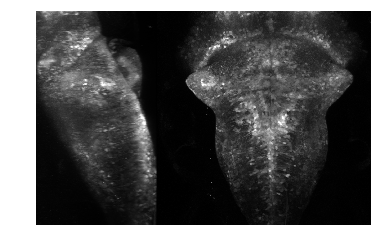

In [6]:
pf = proj_fuse(data[:,1], np.max, aspect=(int(aspect),1,1), arrangement=[2,0,1])[:data.shape[2],:]
plt.imshow(pf, cmap='gray')
plt.axis('off')

In [7]:
d_ = data[:,1]
#d_ = contrast_adjusted
stretched = resize(d_, output_shape = (d_.shape[0] * np.round(aspect), d_.shape[1], d_.shape[2]))
dog = gaussian_filter(stretched, sigma=(1,1,1)) - gaussian_filter(stretched, sigma=(4,4,4))

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


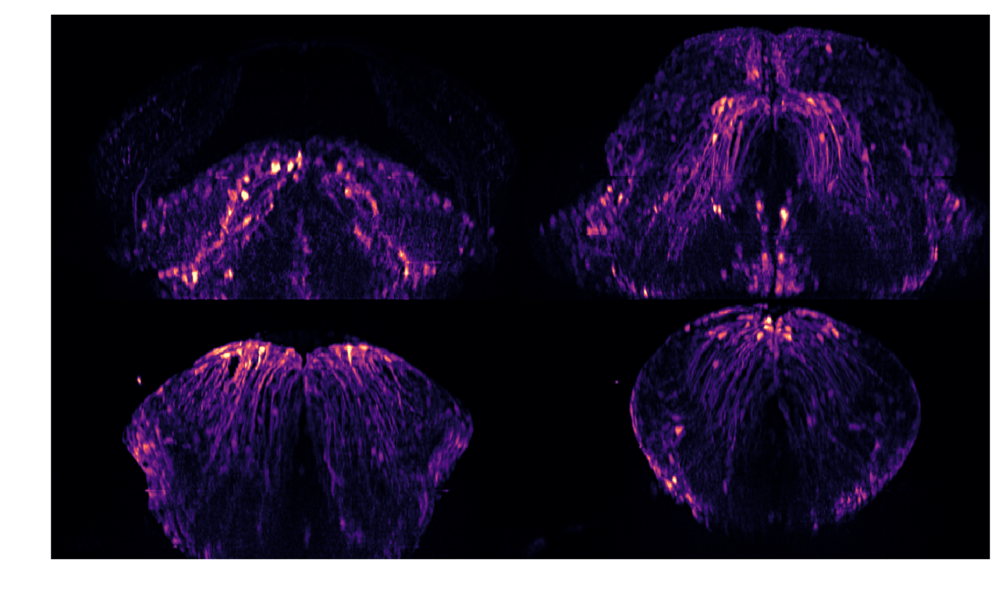

In [11]:
fig, axs = plt.subplots(figsize=(12,12), dpi=200)
from skimage.util import montage
num_ims = 16

crop = (slice(None), slice(None), slice(80,-80))
tmp_ = dog[crop]
mont = np.zeros([num_ims, tmp_.shape[0], tmp_.shape[2]])
step = tmp_.shape[2]//num_ims

for ind in range(num_ims):        
    mont[ind] = tmp_[:,(step * ind) : (step * (ind + 1))].max(1)

plt.imshow(montage(mont[::4])[50:-100], cmap='magma', clim=(0,mont.max() / 2))
axs.axis('off')
fig_fname = 'dog_rc_sections.pdf'
plt.savefig(fig_dir + fig_fname)

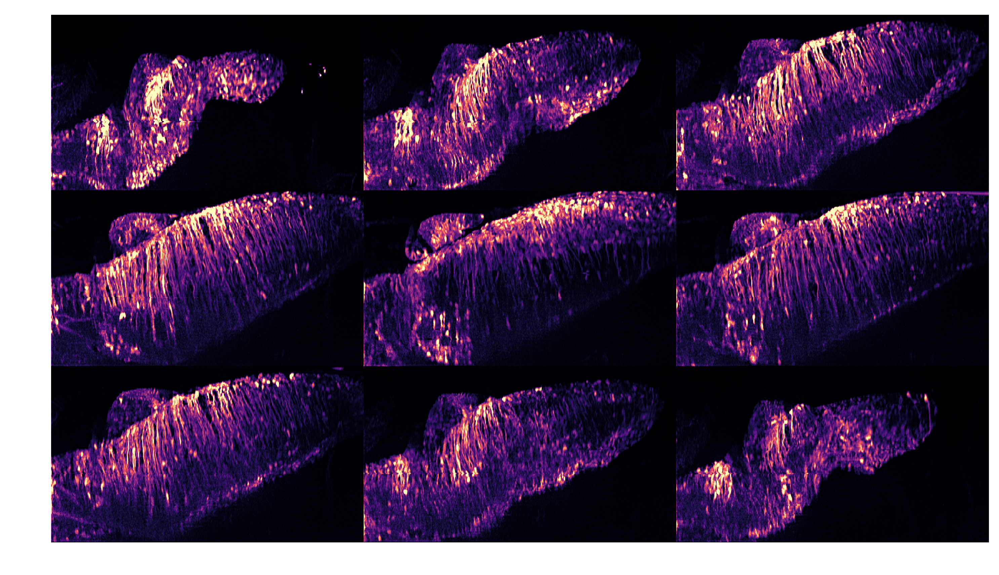

In [13]:
fig, axs = plt.subplots(figsize=(12,12), dpi=300)
from skimage.util import montage
num_ims = 9
crop = (slice(None), slice(None), slice(250,-200))
tmp_2 = dog[crop]
mont = np.zeros([num_ims, tmp_2.shape[0], tmp_2.shape[1]])
step = tmp_2.shape[2]//num_ims
for ind in range(num_ims):
    mont[ind] = tmp_2[:,:,(step * ind) : (step * (ind + 1))].max(2)

plt.imshow(montage(mont), cmap='magma', clim=(0,mont.max() / 4))
axs.axis('off')
fig_fname = 'dog_ml_sections.pdf'
plt.savefig(fig_dir + fig_fname)

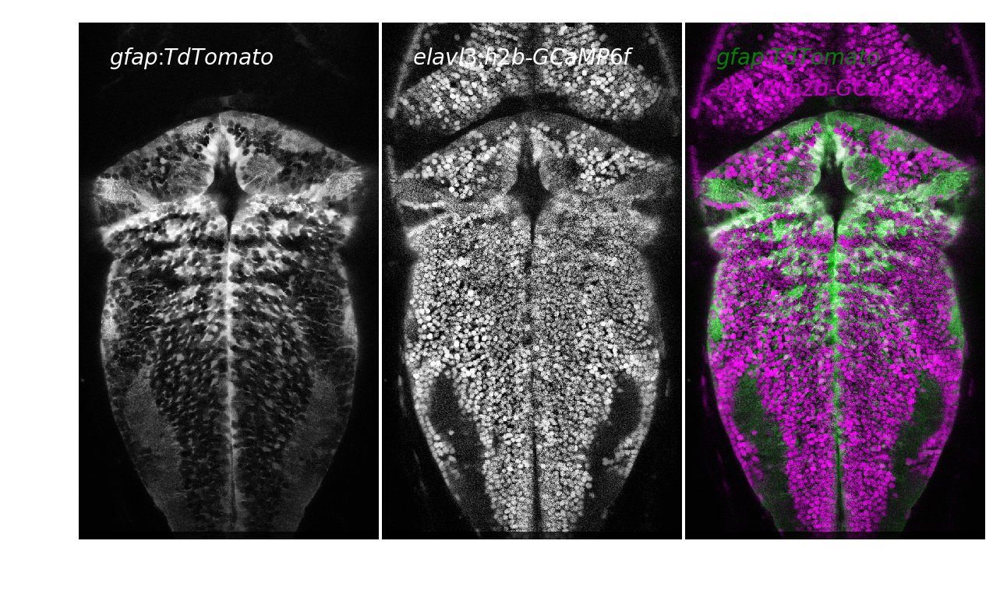

In [14]:
fig, axs = plt.subplots(figsize=(7.5,11),dpi=200, ncols=3)
from matplotlib.cm import gray
z = 35
base_g = data[z,1]
base_n = data[z,0]
eq = lambda v: equalize_adapthist(v, kernel_size=(data.shape[-2] // 20, data.shape[-1] // 20), nbins=512)
filts = [eq(d) for d in (base_g, base_n)]
crop = slice(None), slice(250,-180)
#crop = (slice(500, -50), slice(350,-300))
composite = gray(filts[0][crop]) * np.array([[0,1,0,1]]) + gray(filts[1][crop]) * np.array([1,0,1,1])

labels = {}
labels['g'] = dict(x = .1, y=.92, s='$\it{gfap}$:$\it{TdTomato}$', color='w', transform=axs[0].transAxes)
labels['n'] = dict(x = .1, y=.92, s='$\it{elavl3}$:$\it{h2b}$-$\it{GCaMP6f}$', color='w', transform=axs[1].transAxes)
labels['merge_g'] = dict(x = .1, y=.92, s='$\it{gfap}$:$\it{TdTomato}$', color='g', transform=axs[2].transAxes)
labels['merge_n'] = dict(x = .1, y=.86, s='$\it{elavl3}$:$\it{h2b}$-$\it{GCaMP6f}$', color='m', transform=axs[2].transAxes)

axs[0].imshow(filts[0][crop], cmap='gray', clim=(0,None))
axs[1].imshow(filts[1][crop], cmap='gray')
axs[2].imshow(composite)
axs[0].text(**labels['g'])
axs[1].text(**labels['n'])
axs[2].text(**labels['merge_n'])
axs[2].text(**labels['merge_g'])
[ax.axis('off') for ax in axs]
plt.subplots_adjust(hspace=0, wspace=.01)
fname = 'glial_neuronal_anatomy.pdf'
plt.savefig(f'../../figures/ch2/{fname}')

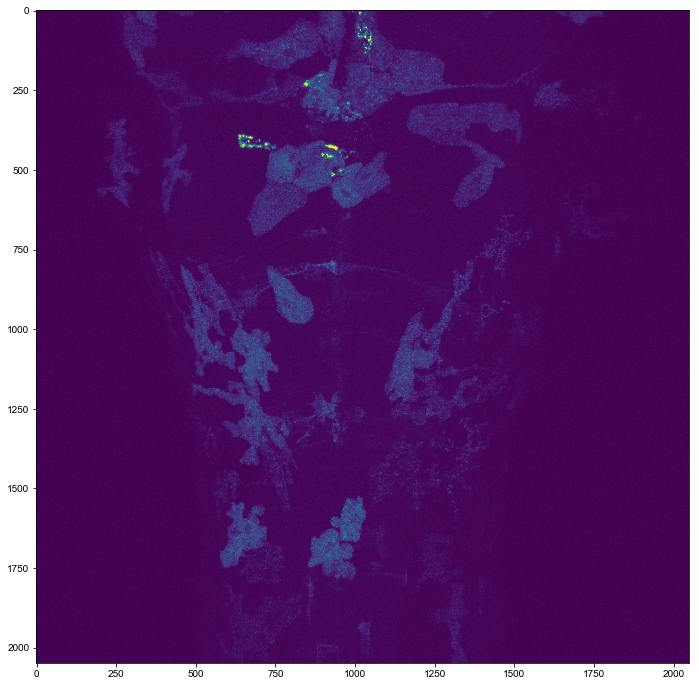

In [15]:
single_cell_fname = '/groups/ahrens/ahrenslab/davis/data/confocal/20150930/8dpf_gfap-brainbow_gfap-gcamp6f_inj_F1.lsm'
single_cell_pixel_spacing = get_lsm_pixel_spacing(single_cell_fname)
single_cells = imread(single_cell_fname, plugin='tifffile').squeeze()[:,:,:,0]
single_cell_pixel_zyx = get_lsm_pixel_spacing(single_cell_fname)
fig, axs = plt.subplots(figsize=(12,12))
plt.imshow(single_cells.max(0))

In [209]:
w = flw(tmp.max(1))

In [228]:
pts = [(int(p.x()), int(p.y())) for p in w.rois[0].getPoints()]
mask= get_mask(tmp.max(1), pts)

In [339]:
masked_data = (tmp.transpose(1,0,2) * mask).transpose(1,0,2)

In [401]:
masked_fname = single_cell_fname.split('/')[-1].split('.')[0] + '_masked_g.tif'
from skimage.io import imsave
imsave(f'/groups/ahrens/ahrenslab/davis/thesis/{masked_fname}', masked_data)

/groups/ahrens/home/bennettd/anaconda3/lib/python3.6/site-packages/skimage/io/_io.py:140: UserWarning: /groups/ahrens/ahrenslab/davis/thesis/8dpf_gfap-brainbow_gfap-gcamp6f_inj_F1_masked_g.tif is a low contrast image
  warn('%s is a low contrast image' % fname)


In [16]:
masked_fname = '../../data/ch2/8dpf_gfap-brainbow_gfap-gcamp6f_inj_F1_masked_g.tif'
masked_data = imread(masked_fname)

In [140]:
masked_data.shape

(70, 300, 1150)

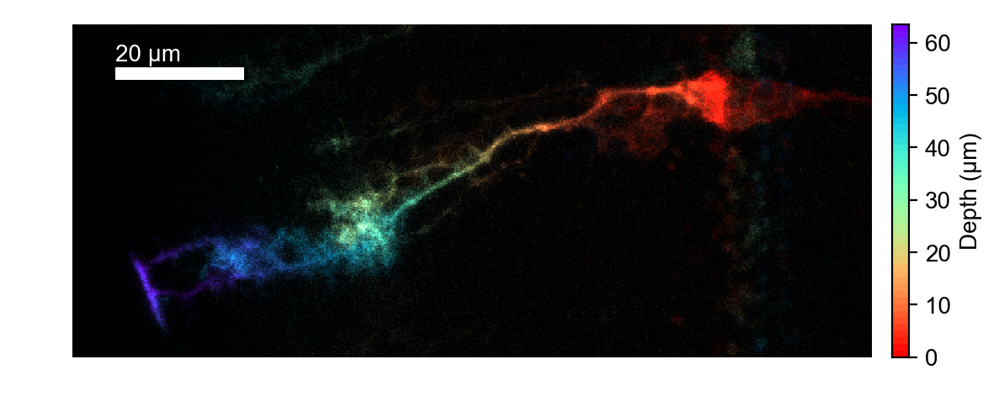

In [148]:
fig, axs = plt.subplots(figsize=(6.5,4),dpi=200)
proj_cmap = 'rainbow_r'
proj_clim = (2, 150)
proj_roi = slice(28, None), slice(0, 250), slice(200,800)
cropped_masked_data = masked_data[proj_roi]

proj_data = depth_project(cropped_masked_data, clim=proj_clim, cmap=proj_cmap)
axs.imshow(proj_data)
divider = make_axes_locatable(axs)
cax = divider.append_axes("right", size="5%", pad=0.05)
dpth = cropped_masked_data.shape[0] * single_cell_pixel_zyx[0]
cax.imshow(np.linspace(1,0).reshape(-1,1), cmap=proj_cmap, extent=(0,dpth/20,0,dpth))
cax.yaxis.tick_right()
cax.yaxis.set_label_position('right')
axs.axis('off')
cax.xaxis.set_visible(False)
cax.set_ylabel('Depth (μm)')
scb_len = 20
xy_px = single_cell_pixel_zyx[1]
scb_dims = scb_len / xy_px, (scb_len/10) / xy_px 
scb_rect = Rectangle((scb_dims[0]//3,scb_dims[0]//3), *scb_dims, fill=True, edgecolor=None, facecolor='w')
axs.add_patch(scb_rect)
axs.text(scb_rect.xy[0], scb_rect.xy[1] - scb_dims[1] / 2, f'{scb_len} μm', color='w')
fig_fname = 'single_cell_depth_proj.pdf'
plt.savefig(fig_dir + fig_fname)

In [149]:
pix_zyx

array([3.   , 0.554, 0.554])

In [88]:
glia_nuclei_fname = '/groups/ahrens/ahrenslab/davis/anatomy/6dpf_cy331_f1_dv_1.lsm'
glia_nuclei_zyx = get_lsm_pixel_spacing(glia_nuclei_fname)
aspect = glia_nuclei_zyx[0] / glia_nuclei_zyx[1]
data_r = imread(glia_nuclei_fname, plugin='tifffile').squeeze()

In [23]:
overlap_percent = 10
overlap = (data_r.shape[2] // overlap_percent)
data = np.hstack([np.squeeze(d[:,:,:-overlap]).transpose(0,2,1) for d in data_r]).transpose(0,2,1)

out_range = data.min(), data.max()
def rescaler(v):
    return rescale(v, in_range=tuple(np.percentile(v, [30,99.99])), out_range=out_range)
#rescaler = partial(rescale, out_range=out_range)
data_rescaled = da.from_array(data, chunks=(1, *data.shape[1:])).map_blocks(rescaler, dtype='int').compute()
data_rescaled = rescale(data_rescaled.astype('float'), out_range=(0,1))

ang_xy = -6
data_ro = rotate(data_rescaled, ang_xy, axes=(1,2), cval=0)

In [47]:
def mdp(data, axis, cmap):
    from skimage.exposure import rescale_intensity as rescale
    from numpy import argmax, linspace, zeros
    # max project to get intensity, then use depth to set color
    mx = rescale(data.max(axis).astype('float'), out_range=(0,1))
    remapped = zeros((*mx.shape[1:], 4))
    dp = argmax(data, axis)    
    col_array = cmap(linspace(0, 1, data.shape[axis]))
    remapped = (col_array[dp,:].transpose(2,1,0) * mx.T).transpose(2,1,0)
    
    return remapped
    

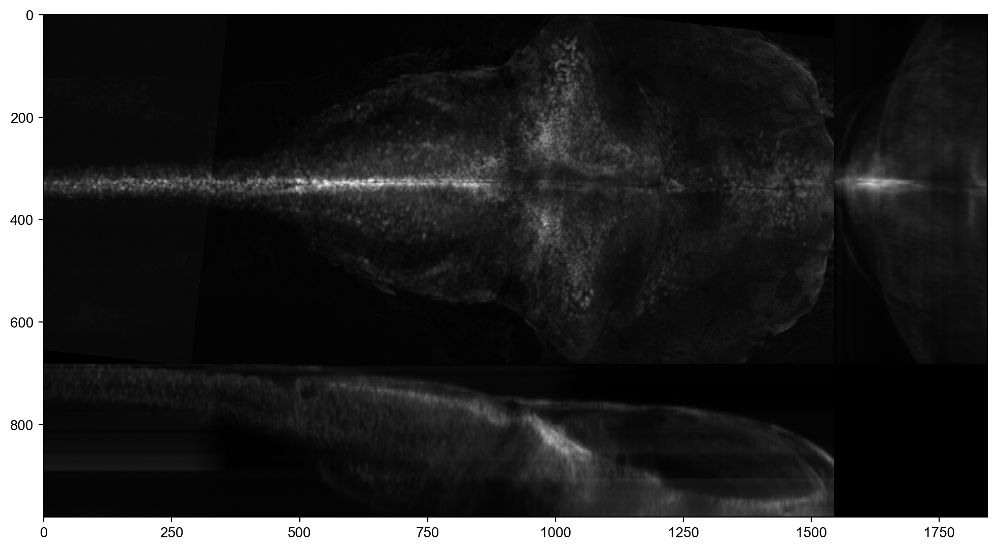

In [27]:
fig, axs = plt.subplots(ncols=1, figsize=(12,12), dpi=200)
crop = (slice(None), slice(150, -150), slice(400,-200))

axs.imshow(proj_fuse(data_ro[crop], np.mean, aspect=(int(aspect),1,1)), cmap='gray')

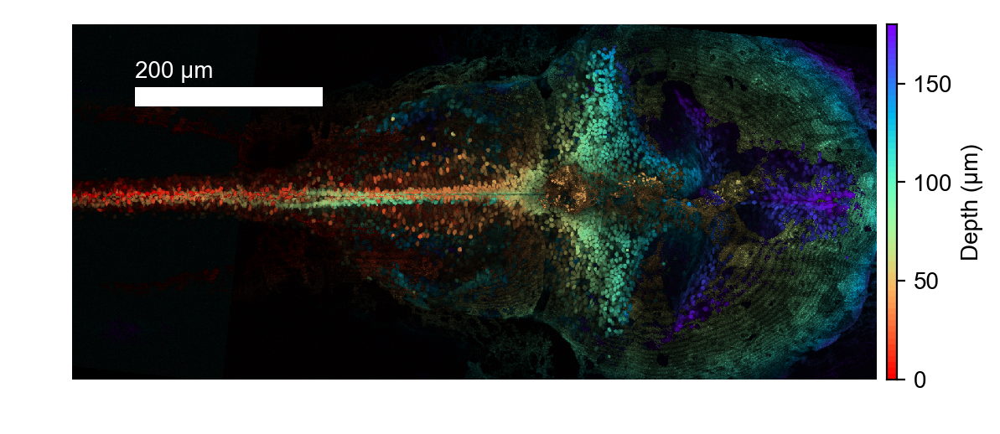

In [98]:
from matplotlib import cm
proj_axis = 0
tmp = mdp(data_ro[crop], proj_axis, cm.rainbow_r)[:,:,:-1]
cmap = np.tile(cm.rainbow(np.linspace(0,1,data.shape[proj_axis])), (1,1,1)).transpose(1,0,2)[::-1]
fig = plt.figure(figsize=(6,6), dpi=200)

axs = fig.add_axes([0,0,.8,1]), fig.add_axes([.85,0,.15,1])
axs[0].set_facecolor('k')
axs[0].imshow(tmp)
#axs[0].imshow(tmp[:,:,:-1], aspect=1, interpolation='bicubic')
axs[0].axis('off')
cbar_pos = axs[0].get_position()
pad = .01

cbar_pos.x0 = cbar_pos.x1 + pad
cbar_pos.x1 = cbar_pos.x0 + .01
axs[1].set_position(cbar_pos)
axs[1].imshow(cmap, origin='lower', aspect='auto', extent=(0,1,0,data_ro.shape[proj_axis] * pix_zyx[proj_axis]))
axs[1].yaxis.tick_right()
axs[1].tick_params(axis='both', bottom=False, labelbottom=False)
axs[1].yaxis.set_label_position('right')
axs[1].set_ylabel('Depth (μm)')

scb_len = 200
xy_px = glia_nuclei_zyx[1]
scb_dims = scb_len / xy_px, (scb_len/10) / xy_px 
scb_rect = Rectangle((scb_dims[0]//3,scb_dims[0]//3), *scb_dims, fill=True, edgecolor=None, facecolor='w')
axs[0].add_patch(scb_rect)
axs[0].text(scb_rect.xy[0], scb_rect.xy[1] - scb_dims[1] / 2, f'{scb_len} μm', color='w')

fig_fname = 'mdp_glial_nuclei_dv.pdf'
plt.savefig(fig_dir + fig_fname)

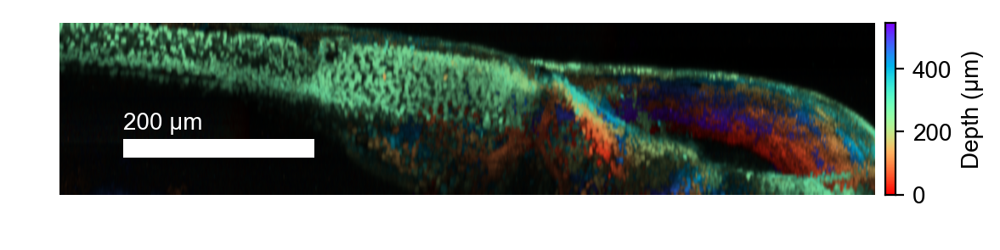

In [121]:
from matplotlib import cm
proj_axis = 1
tmp = mdp(data_ro[crop], proj_axis, cm.rainbow_r)
cmap = np.tile(cm.rainbow(np.linspace(0,1,data.shape[proj_axis])), (1,1,1)).transpose(1,0,2)[::-1]
fig = plt.figure(figsize=(6,6), dpi=200)

axs = fig.add_axes([0,0,.8,1]), fig.add_axes([.85,0,.15,1])
axs[0].set_facecolor('k')
axs[0].imshow(tmp[:,:,:-1], aspect=aspect, interpolation='bicubic')
axs[0].axis('off')
cbar_pos = axs[0].get_position()
pad = .01

cbar_pos.x0 = cbar_pos.x1 + pad
cbar_pos.x1 = cbar_pos.x0 + .01
axs[1].set_position(cbar_pos)
axs[1].imshow(cmap, origin='lower', aspect='auto', extent=(0,1,0, data_ro.shape[proj_axis] * pix_zyx[proj_axis]))
axs[1].yaxis.tick_right()
axs[1].tick_params(axis='both', bottom=False, labelbottom=False)
axs[1].yaxis.set_label_position('right')
axs[1].set_ylabel('Depth (μm)')

scb_len = 200
xy_px = glia_nuclei_zyx[1]
scb_dims = scb_len / xy_px, (scb_len/10) / glia_nuclei_zyx[0] 
scb_rect = Rectangle((scb_dims[0]//3, 6 * scb_dims[1]), *scb_dims, fill=True, edgecolor=None, facecolor='w')
axs[0].add_patch(scb_rect)
axs[0].text(scb_rect.xy[0], scb_rect.xy[1] - scb_dims[1] / 2, f'{scb_len} μm', color='w')


fig_fname = 'mdp_glial_nuclei_ml.pdf'
plt.savefig(fig_dir + fig_fname)

In [123]:
# store the coordinates of some example cells
thr = .2
supra = (data_rescaled[crop] > thr).sum()
cell_vol = 49

print(supra / cell_vol * .9)
print(supra / cell_vol)
print(supra / cell_vol * 1.1)

11828.589795918368
13142.877551020409
14457.165306122452


In [17]:
flw(data)

/groups/ahrens/home/bennettd/anaconda3/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]
